# Clustering of all data

Read in all necessary packages:

In [36]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pandas.io.parsers import read_csv
import scanpy as sc
import numpy as np
from functools import reduce
from anndata import AnnData, read_h5ad
import loompy
import collections
import scipy
import math
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import zscore
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap

In [2]:
sc.set_figure_params(dpi = 200)
sns.set_style("white")
sns.set_context("talk")
sns.set_style("ticks")

# Load the dataset

In [3]:
#import loom in adata
adata = sc.read_h5ad('input/20230619_allGastruloids_UMAP_celltypes_incChroms.h5ad')


In [4]:
adata

AnnData object with n_obs × n_vars = 38117 × 27384
    obs: 'batch2', 'batch', 'day', 'replicates', 'mark', 'day_rep', 'dataset', 'cellnames', 'bc', 'cellname', 'percent_mito', 'n_counts', 'n_counts_proteincoding', 'n_counts_stressgenes', 'n_genes', 'S_score', 'G2M_score', 'phase', 'histone_score', 'mark_binary', 'enrichment', 'coverage', 'QC', 'umap_density_mark', 'predicted_id_E75', 'predicted_id_E85', 'prediction_confidence_E75', 'prediction_confidence_E85', 'predicted_final', 'leiden', 'celltype', 'old_leiden_general', 'old_celltype', 'old_leiden_merge', 'umap_1D', 'umap_1D_rescale', 'celltype_general', 'lineage', 'lin_day', 'hour', 'PT1', 'PT2', 'PT1_avg', 'K4_total', 'K27_total', 'K4_total_log', 'K27_total_log', 'RNA_total_log'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene', 'gene_biotype', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'QC_colors', 'batch_colors', 'celltype_colors', 'celltype_

In [5]:
greens_r = sns.blend_palette(['black','#238b45', '#75c477', '#c8e9c1' ], as_cmap = True)
purples_r = sns.blend_palette(['black','#6a51a3', '#9e9bc8', '#dadaeb'], as_cmap = True)
oranges_r = sns.blend_palette(['black','#d94801', '#fd8e3d', '#fdd1a3'], as_cmap = True)
Green='#238b45'
Purple='#6a51a3'
Orange='#d94801'


In [7]:
daydict=dict(zip(list(adata.obs['hour'].cat.categories), adata.uns['hour_colors']))
lindaydict=dict(zip(list(adata.obs['lin_day'].cat.categories), adata.uns['lin_day_colors']))

celltypecdict=dict(zip(list(adata.obs['celltype'].cat.categories), adata.uns['celltype_colors']))
lineagecdict=dict(zip(list(adata.obs['lineage'].cat.categories), adata.uns['lineage_colors']))

In [34]:
extradetails=adata.obs

#make celltype average
extradetails['PT1_avg']=0
for i in extradetails['celltype'].unique():
    extradetails.loc[extradetails['celltype']==i,'PT1_avg']=extradetails.loc[extradetails['celltype_general']==i,'PT1'].mean()
    
adata.obs['PT1_avg']=extradetails['PT1_avg']

In [8]:
#quantile norm ChIC
k27adata=adata[adata.obs['mark']=='H3K27me3']
K27_counts=pd.DataFrame(k27adata.layers['k27me3_TSS_raw'].toarray())
K27_counts.index=k27adata.obs.index
K27_counts.columns=k27adata.var.index
K27_counts=K27_counts.T
K27_counts.replace(0, np.nan, inplace=True)
K27_quant=(K27_counts/np.nanpercentile(K27_counts, 99, axis=0))
K27_quant[K27_quant>1]=1
#K27_quant=K27_quant.T

k27MatrixForAdata = K27_quant.T.merge(adata.obs['cellnames'], 
                left_index=True,
                right_index=True, 
                how="right").fillna(0).drop('cellnames', 
                                            axis = 1).T.merge(adata.var['Accession'],
                                                              left_index=True,right_index=True,
                                                             how="right").fillna(0).drop('Accession', axis=1).reindex(adata.var.index).T
adata.layers['k27me3_TSS_quant'] = scipy.sparse.csr_matrix(k27MatrixForAdata,dtype=np.float32)


k4adata=adata[adata.obs['mark']=='H3K4me3']
K4_counts=pd.DataFrame(k4adata.layers['k4me3_TSS_raw'].toarray())
K4_counts.index=k4adata.obs.index
K4_counts.columns=k4adata.var.index
K4_counts=K4_counts.T
K4_counts.replace(0, np.nan, inplace=True)
K4_quant=(K4_counts/np.nanpercentile(K4_counts, 99, axis=0))
K4_quant[K4_quant>1]=1
#K27_quant=K27_quant.T

k4MatrixForAdata = K4_quant.T.merge(adata.obs['cellnames'], 
                left_index=True,
                right_index=True, 
                how="right").fillna(0).drop('cellnames', 
                                            axis = 1).T.merge(adata.var['Accession'],
                                                              left_index=True,right_index=True,
                                                             how="right").fillna(0).drop('Accession', axis=1).reindex(adata.var.index).T
adata.layers['k4me3_TSS_quant'] = scipy.sparse.csr_matrix(k4MatrixForAdata,dtype=np.float32)

#quantile norm RNA
counts=pd.DataFrame(adata.layers['matrix'].toarray())
counts.index=adata.obs.index
counts.columns=adata.var.index
counts=counts.T
counts.replace(0, np.nan, inplace=True)
quant=(counts/np.nanpercentile(counts, 99, axis=0))
quant[quant>1]=1
#K27_quant=K27_quant.T

MatrixForAdata = quant.T.merge(adata.obs['cellnames'], 
                left_index=True,
                right_index=True, 
                how="right").fillna(0).drop('cellnames', 
                                            axis = 1).T.merge(adata.var['Accession'],
                                                              left_index=True,right_index=True,
                                                             how="right").fillna(0).drop('Accession', axis=1).reindex(adata.var.index).T
adata.layers['RNA_norm'] = scipy.sparse.csr_matrix(MatrixForAdata,dtype=np.float32)

In [9]:
#free up memory
del k27adata, K27_counts, K27_quant, k27MatrixForAdata
del k4adata, K4_counts, K4_quant, k4MatrixForAdata
del counts, quant, MatrixForAdata

In [11]:
#import total counts per cell, table generated based on SCMO counts per cell table
K4_TA=read_csv('input/H3K4me3_TA.csv',index_col=0)
K27_TA=read_csv('input/H3K27me3_TA.csv',index_col=0)

In [12]:
adata.obs['K4_total']=K4_TA['total']
adata.obs['K27_total']=K27_TA['total']
adata.obs['K4_total_log']=np.log10(adata.obs['K4_total']+1)
adata.obs['K27_total_log']=np.log10(adata.obs['K27_total']+1)
adata.obs['RNA_total_log']=np.log10(adata.obs['n_counts']+1)

Load ChIC QC selectors:

In [222]:
#save results here and restart script to free up space
results_file = '20230619_allGastruloids_UMAP_celltypes_incChroms_norm.h5ad'
adata.write(results_file)

In [38]:
adata = sc.read_h5ad('input/20230619_allGastruloids_UMAP_celltypes_incChroms_norm.h5ad')
adata

AnnData object with n_obs × n_vars = 38117 × 27384
    obs: 'batch2', 'batch', 'day', 'replicates', 'mark', 'day_rep', 'dataset', 'cellnames', 'bc', 'cellname', 'percent_mito', 'n_counts', 'n_counts_proteincoding', 'n_counts_stressgenes', 'n_genes', 'S_score', 'G2M_score', 'phase', 'histone_score', 'mark_binary', 'enrichment', 'coverage', 'QC', 'umap_density_mark', 'predicted_id_E75', 'predicted_id_E85', 'prediction_confidence_E75', 'prediction_confidence_E85', 'predicted_final', 'leiden', 'celltype', 'old_leiden_general', 'old_celltype', 'old_leiden_merge', 'umap_1D', 'umap_1D_rescale', 'celltype_general', 'lineage', 'lin_day', 'hour', 'PT1', 'PT2', 'PT1_avg', 'K4_total', 'K27_total', 'K4_total_log', 'K27_total_log', 'RNA_total_log'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene', 'gene_biotype', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'QC_colors', 'batch_colors', 'celltype_colors', 'celltype_

Subset the adata file based on good/bad chic annotation

['matrix']


saving figure to file figures\umapNanog_RNA_log.png


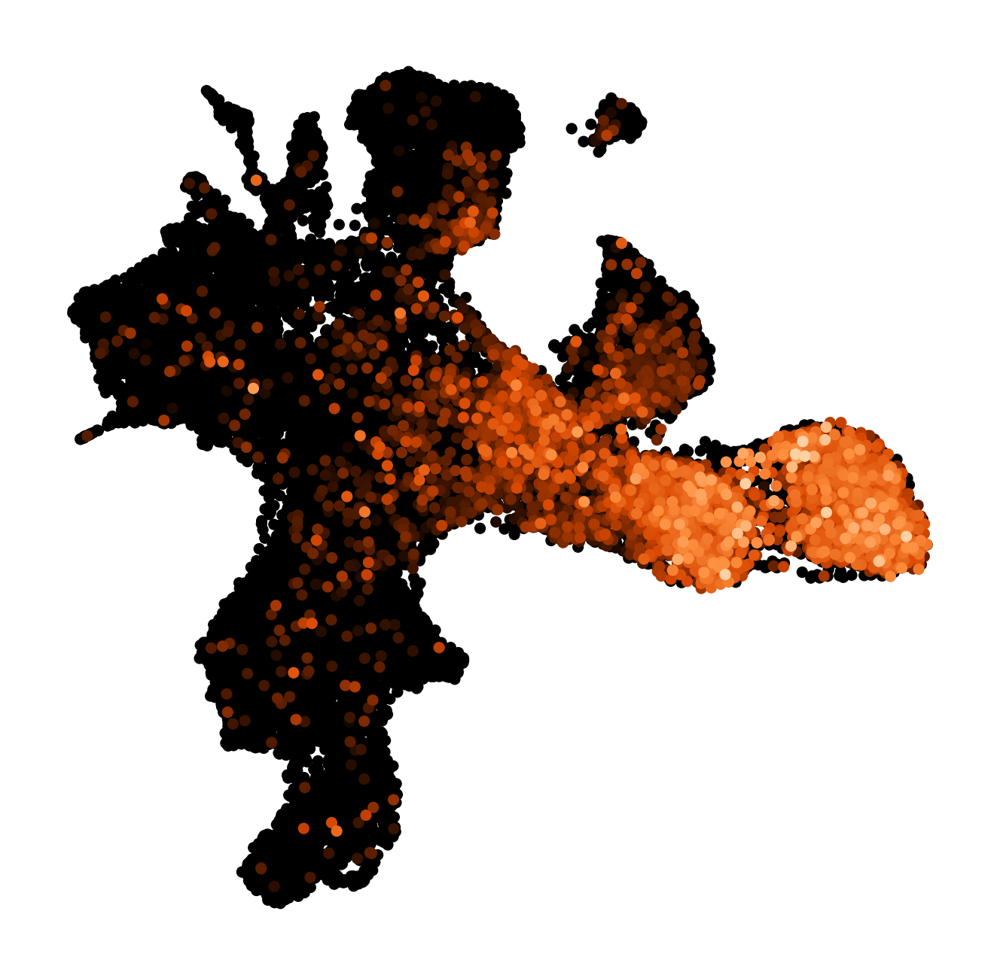

saving figure to file figures\umapT_RNA_log.png


['matrix']


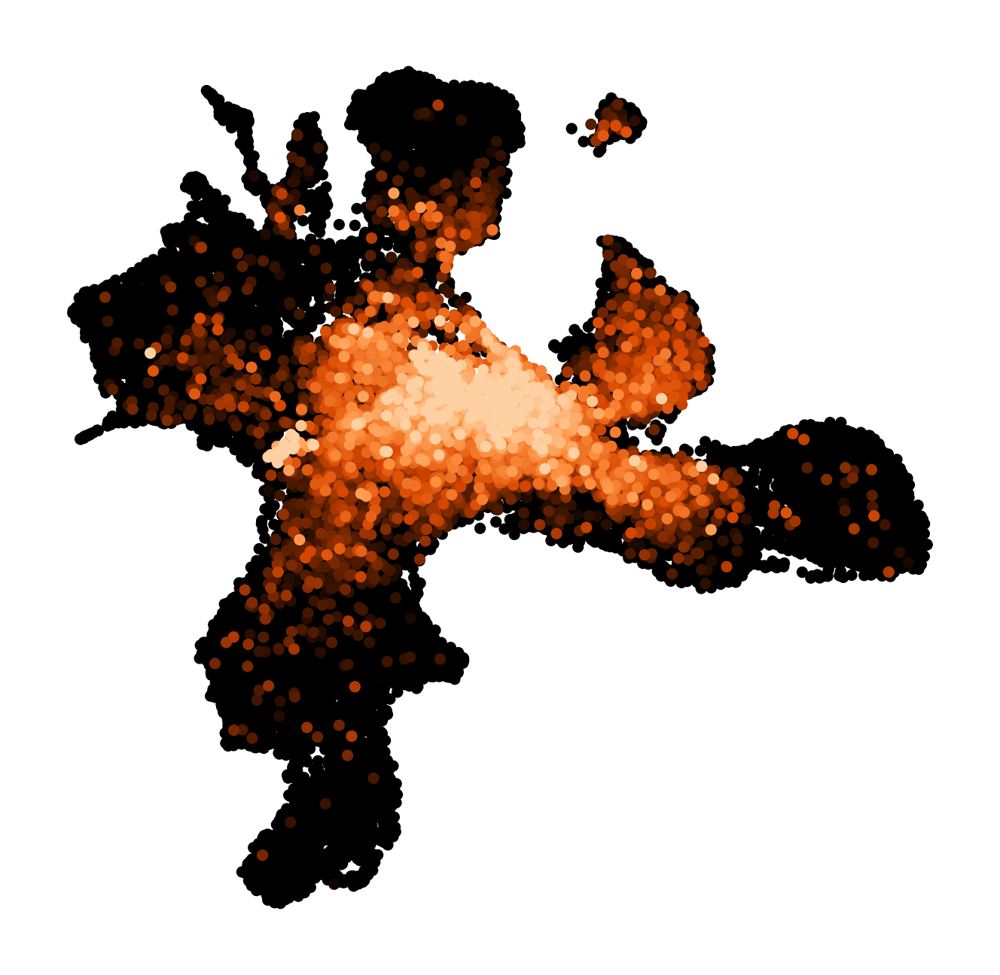

saving figure to file figures\umapSox17_RNA_log.png


['matrix']


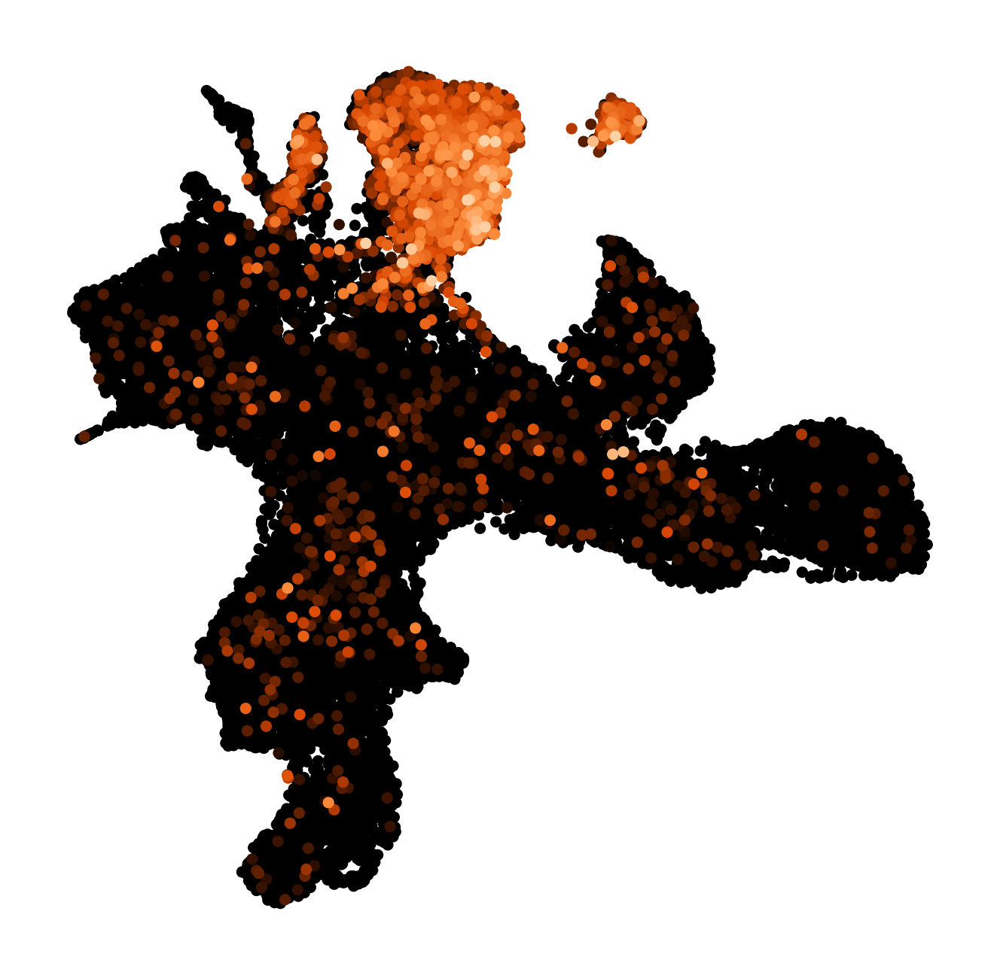

saving figure to file figures\umapPrmt8_RNA_log.png


['matrix']


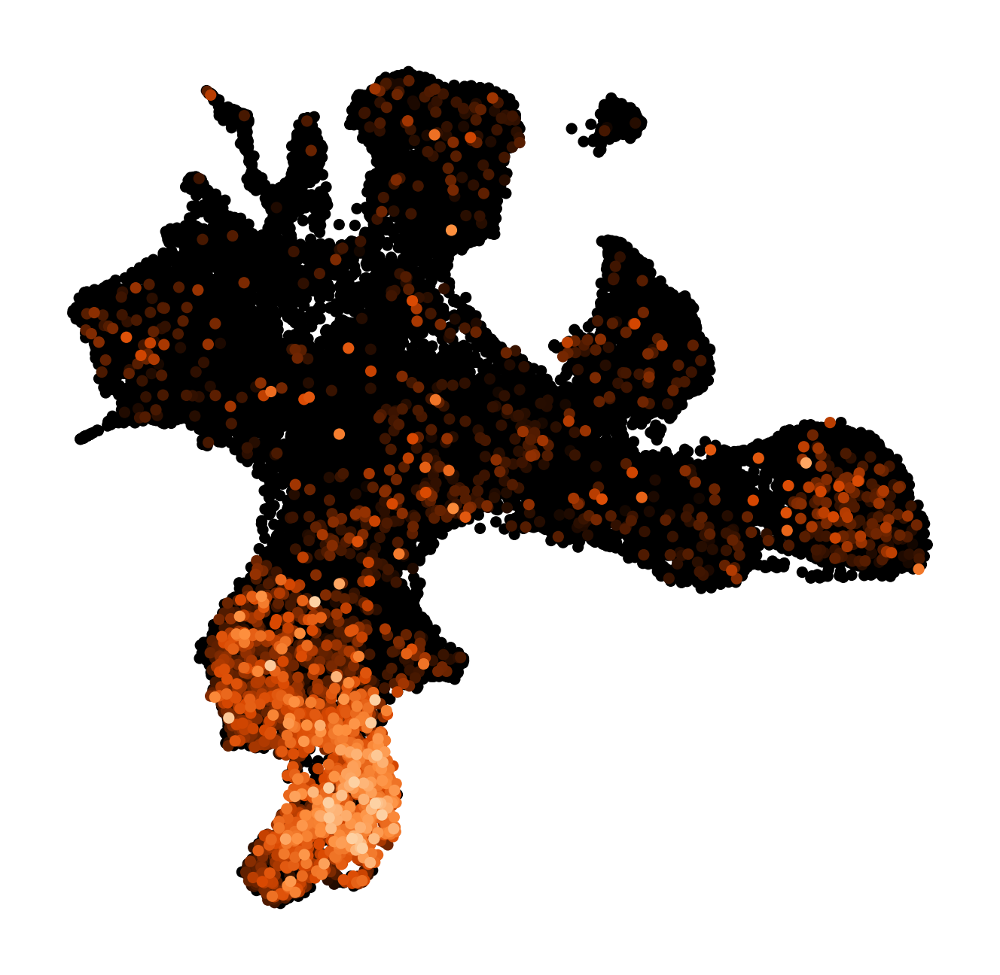

saving figure to file figures\umapHand2_RNA_log.png


['matrix']


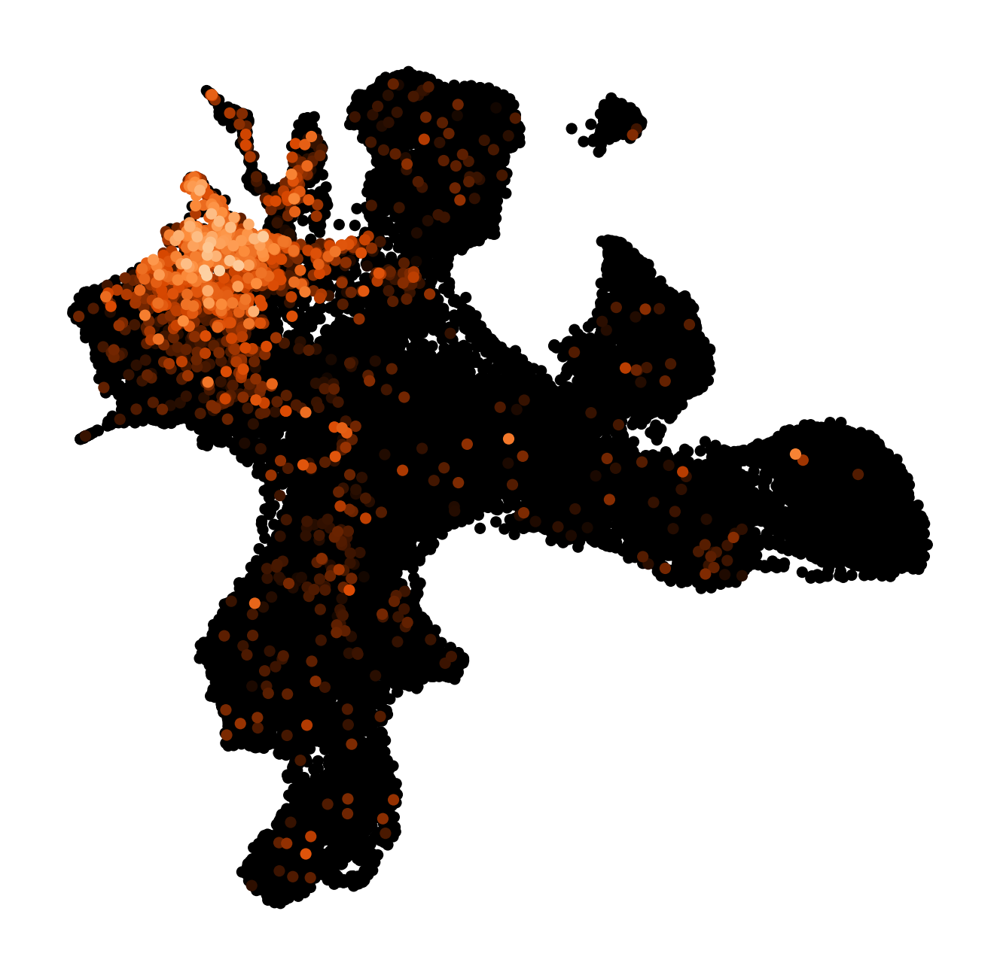

['matrix']


saving figure to file figures\umapNanog_K4_max2.png


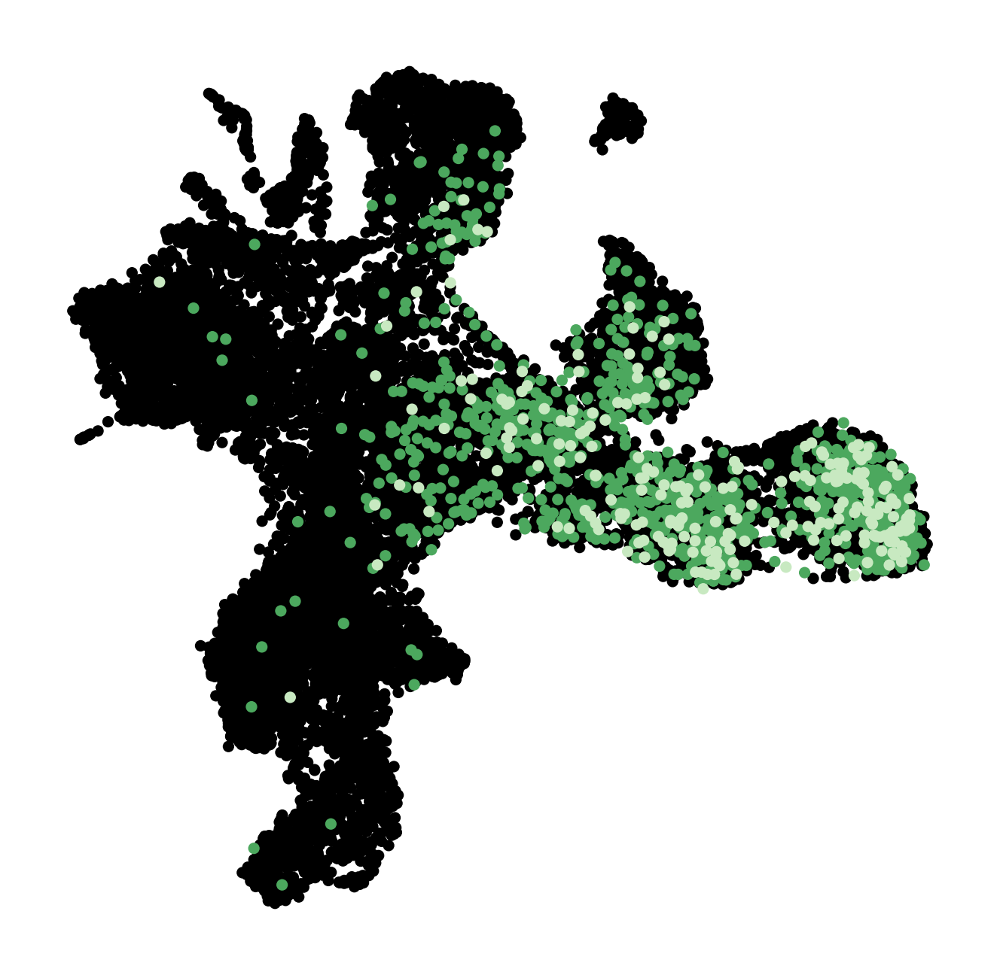

['matrix']


saving figure to file figures\umapT_K4_max2.png


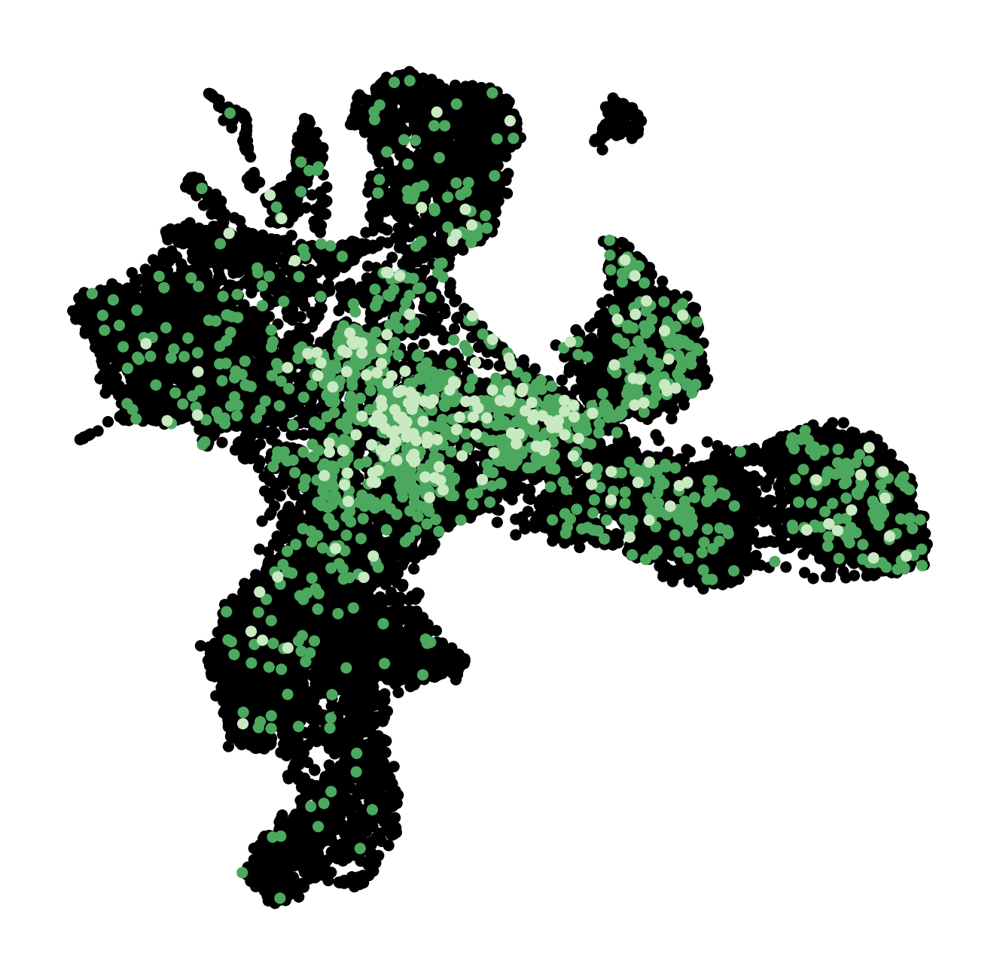

['matrix']


saving figure to file figures\umapSox17_K4_max2.png


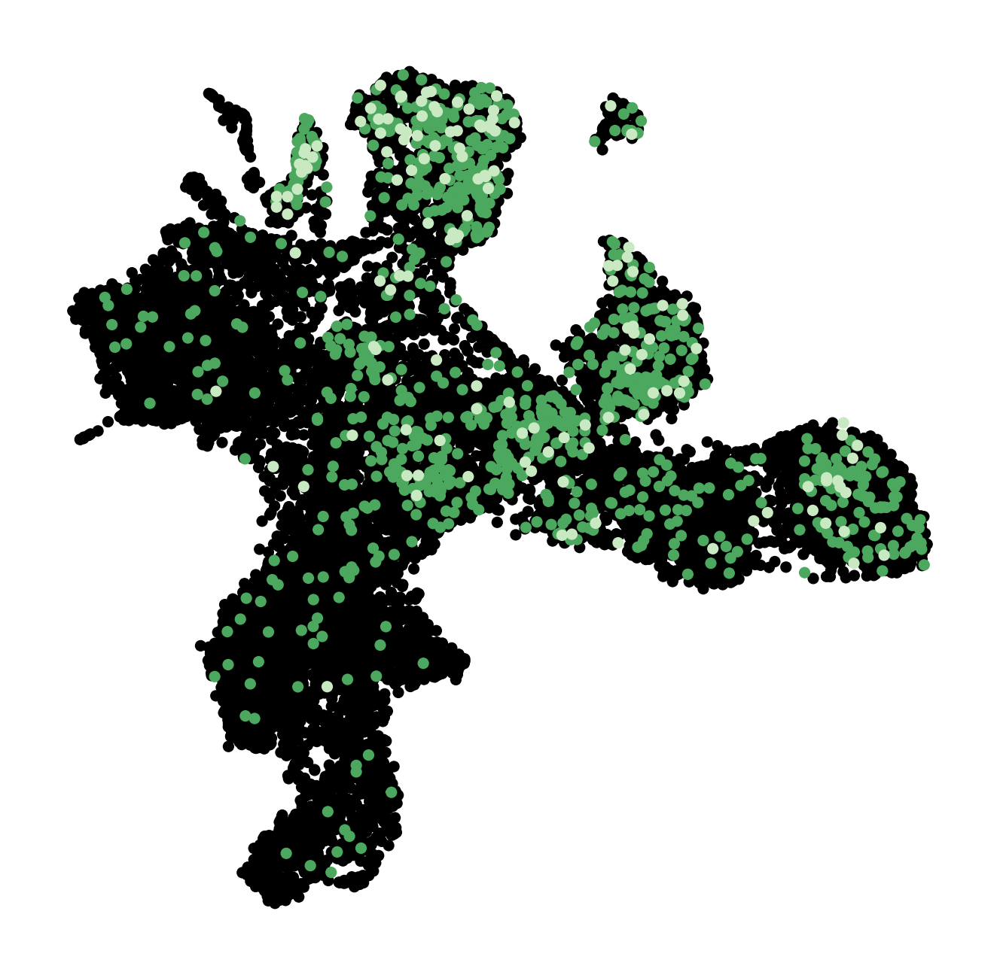

['matrix']


saving figure to file figures\umapPrmt8_K4_max2.png


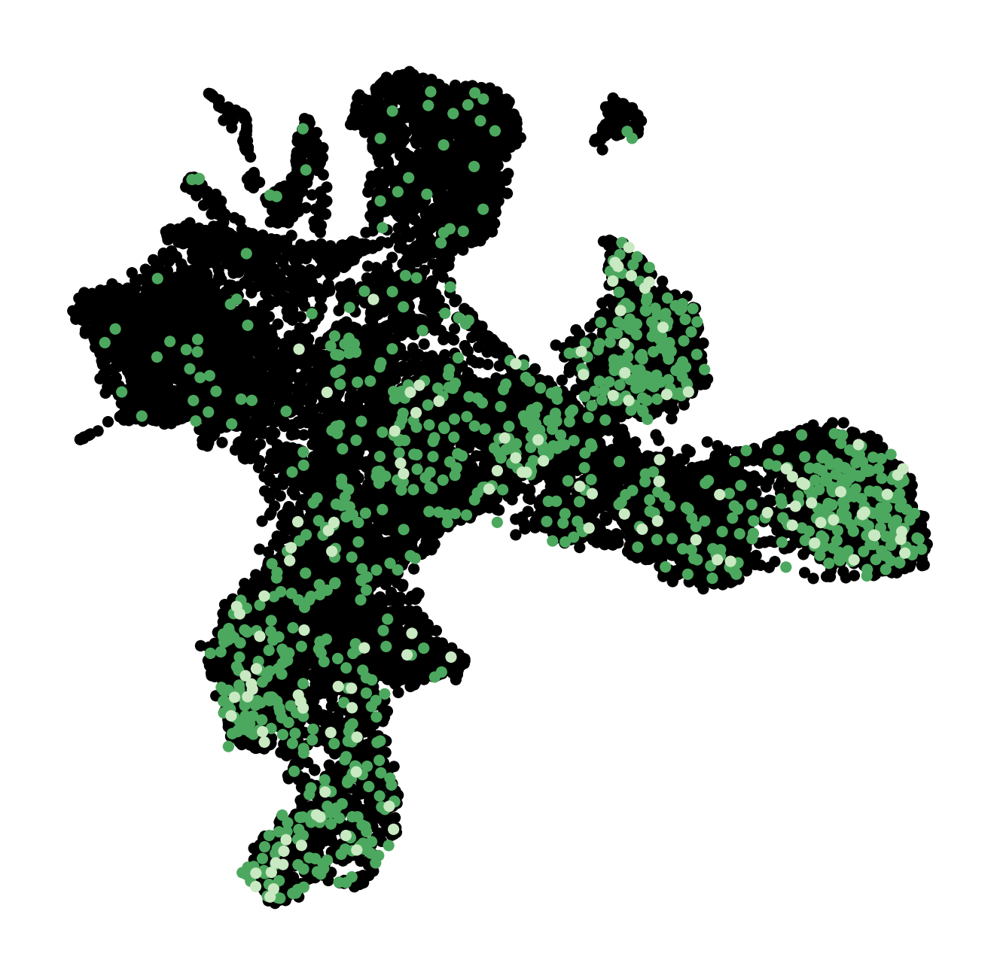

['matrix']


saving figure to file figures\umapHand2_K4_max2.png


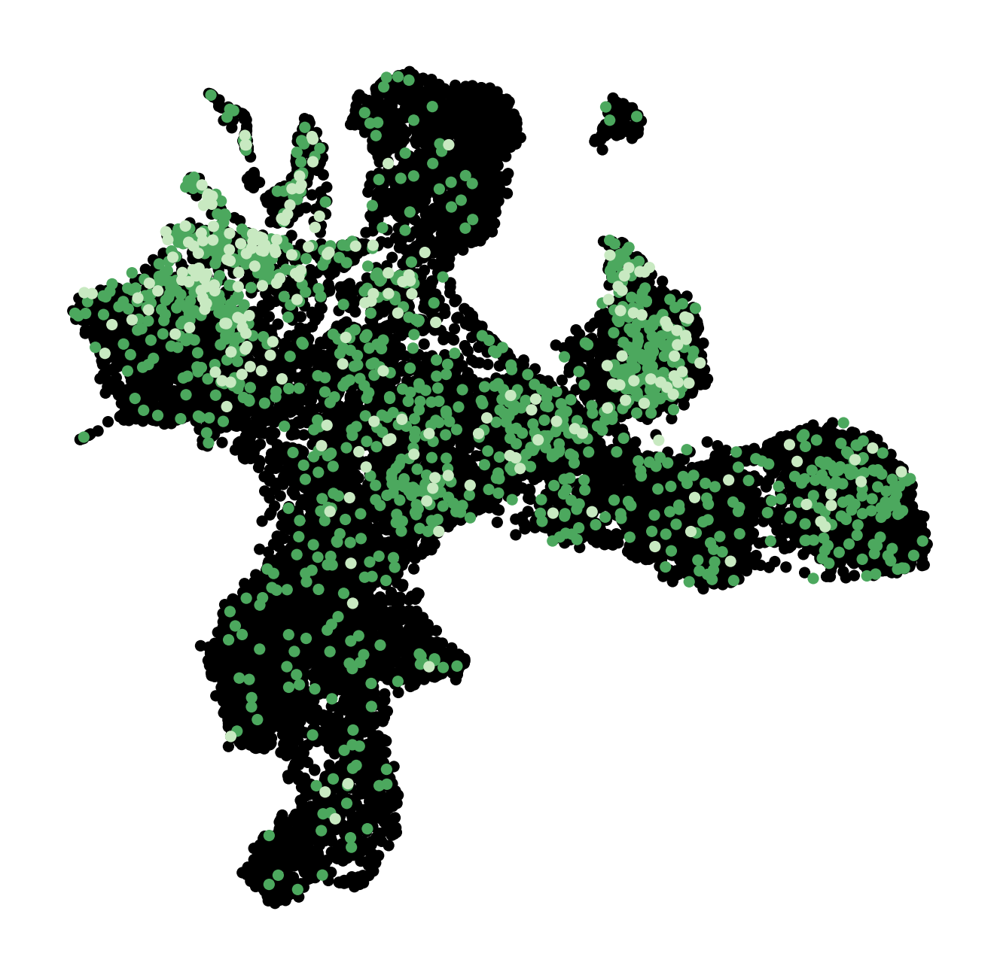

['matrix']


saving figure to file figures\umapNanog_K27.png


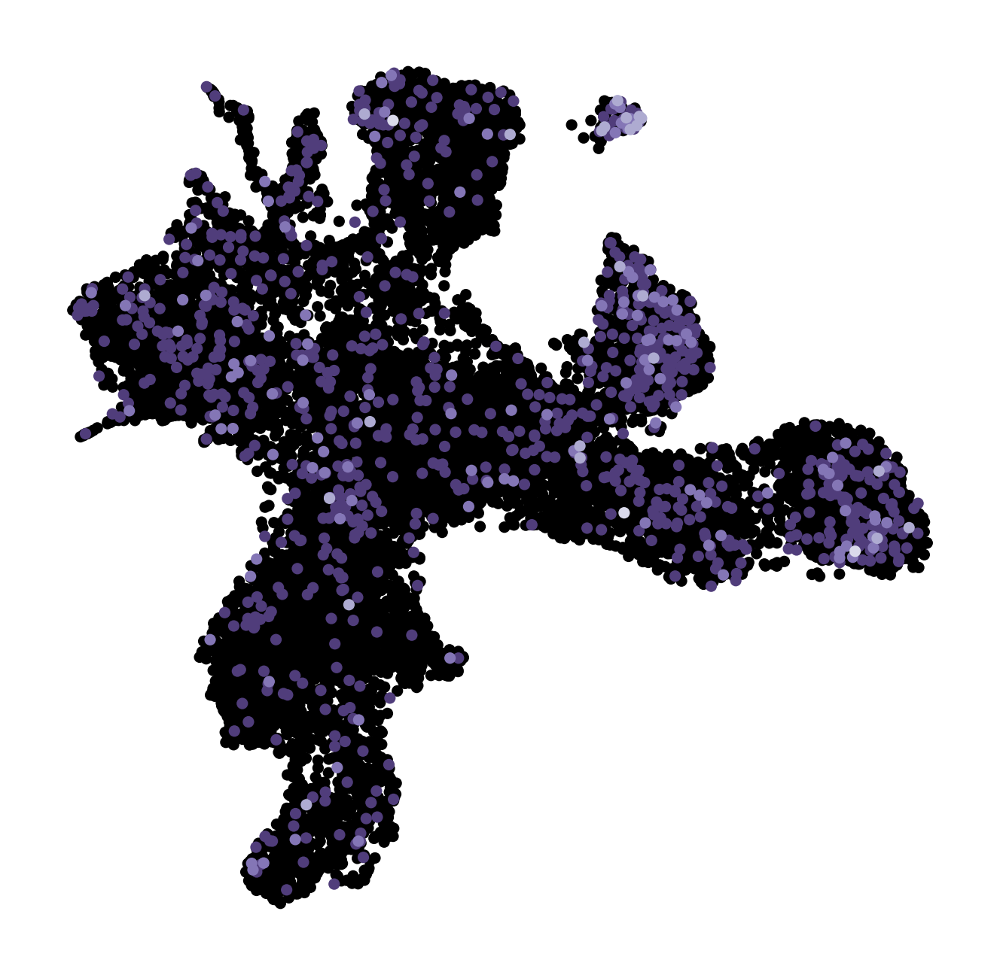

['matrix']


saving figure to file figures\umapT_K27.png


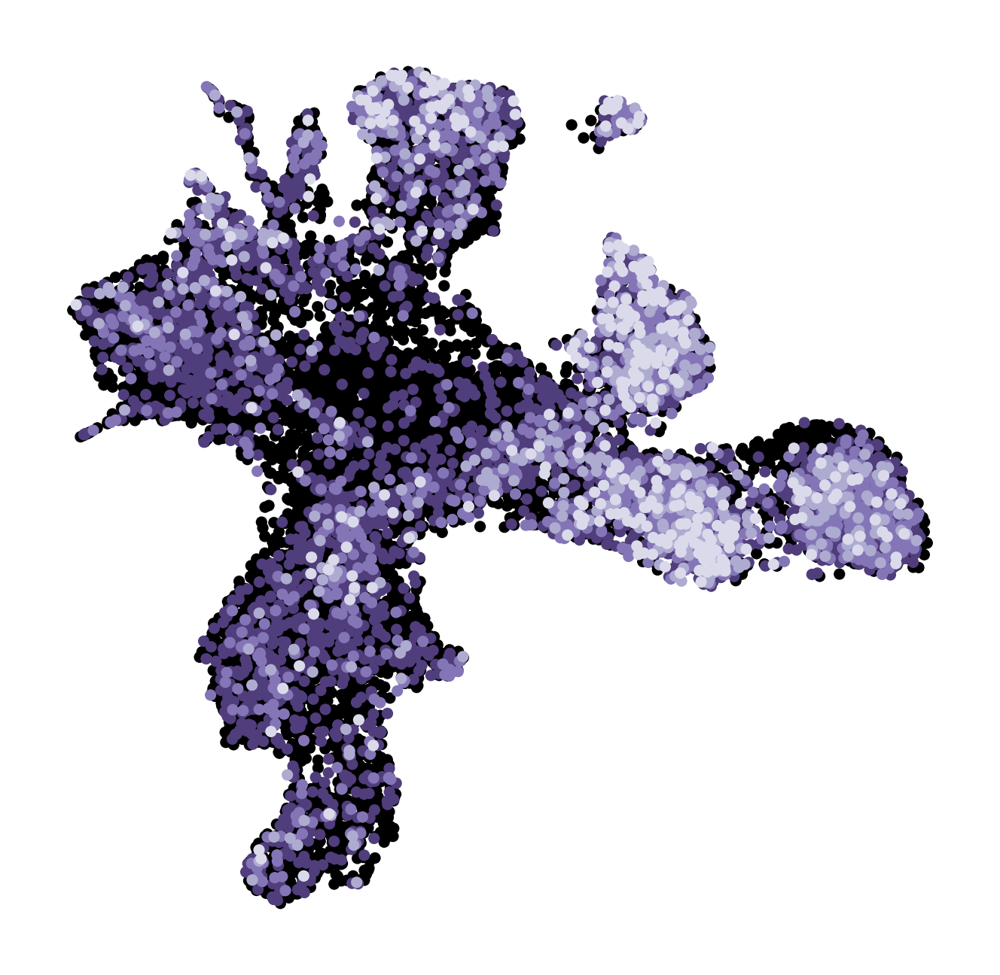

['matrix']


saving figure to file figures\umapSox17_K27.png


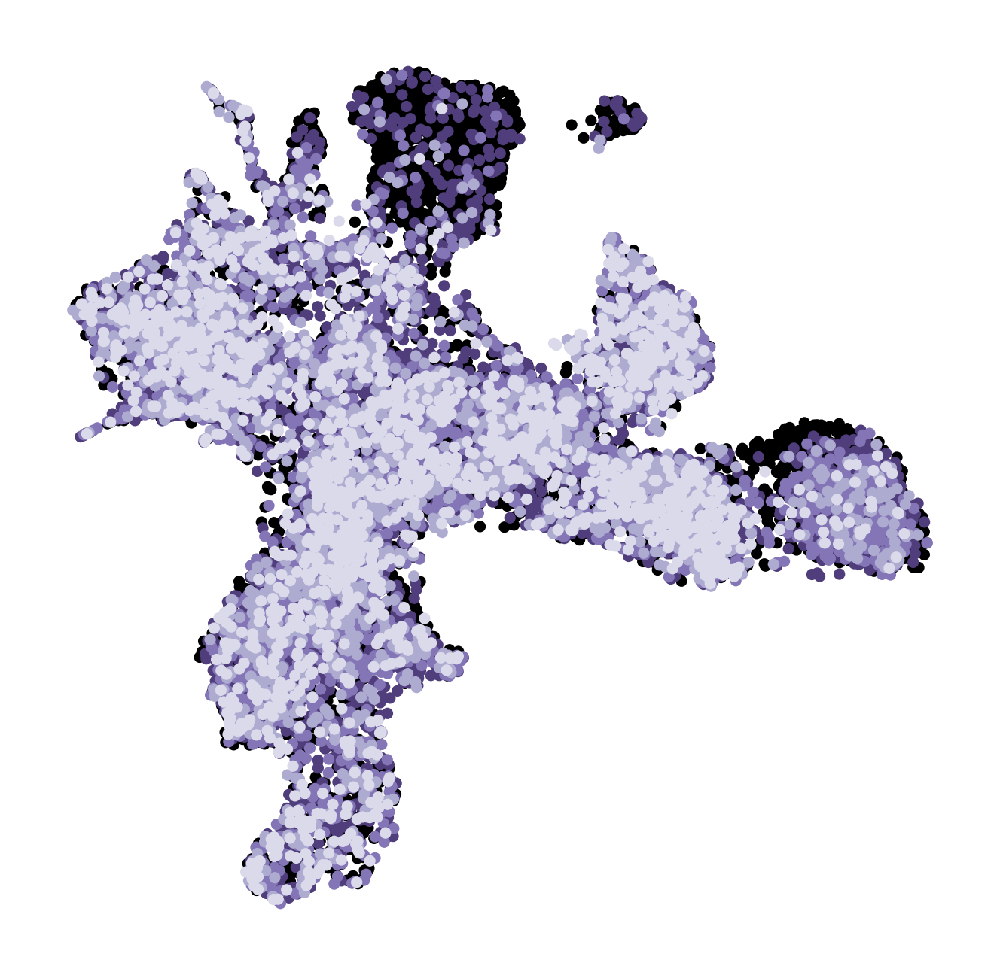

['matrix']


saving figure to file figures\umapPrmt8_K27.png


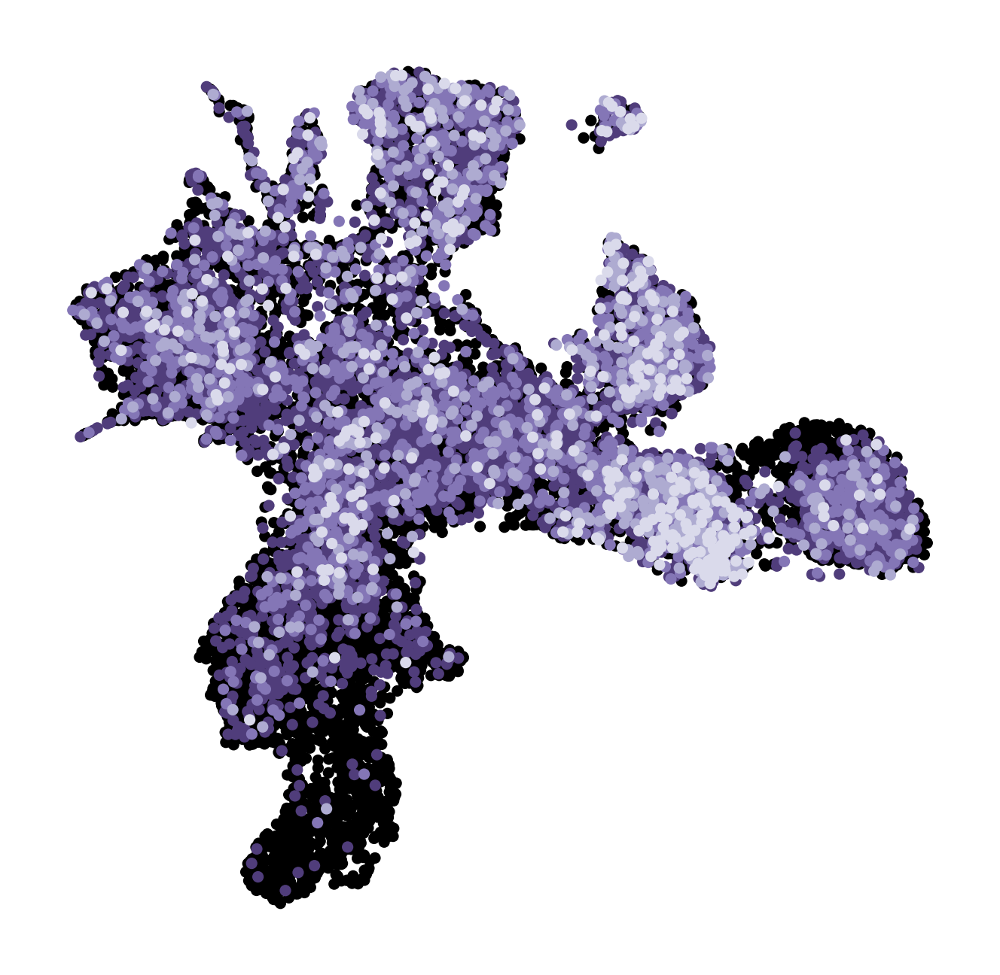

['matrix']


saving figure to file figures\umapHand2_K27.png


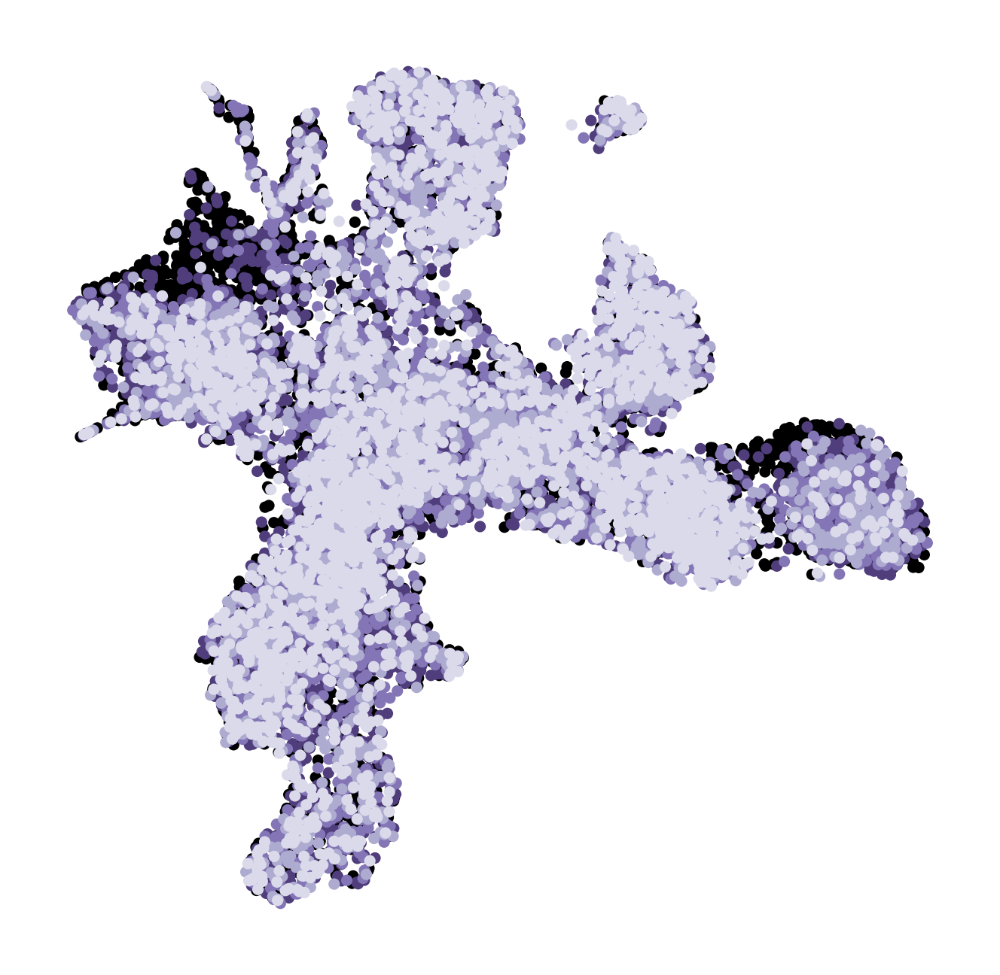

In [15]:
#fig3b
genes = ['Nanog','T','Sox17','Prmt8','Hand2']
for gene in genes:
    print(layer)
    sc.pl.umap(adata,color=gene,colorbar_loc=None, color_map=oranges_r,frameon = False, vmax=1, size = 30,title=[''],ncols=1,save=gene + '_RNA_log.png')

for gene in genes:
    print(layer)
    sc.pl.umap(adata[adata.obs['mark']=='H3K4me3'],color=gene,colorbar_loc=None, color_map=greens_r,frameon = False, size = 30,layer='k4me3_TSS_raw', vmin=0,vmax=2 ,title=[''],ncols=1,save=gene + '_K4_max2.png')

for gene in genes:
    print(layer)
    sc.pl.umap(adata[adata.obs['mark']=='H3K27me3'],color=gene,colorbar_loc=None, color_map=purples_r,frameon = False, size = 30,layer='k27me3_TSS_raw', vmin=0,vmax=4 ,title=[''],ncols=1,save=gene + '_K27.png')
    

In [17]:
plotdata=adata.obs
plotdata=plotdata.sort_values(by='celltype')
tableRNA=pd.DataFrame(columns=['mark','day','cluster','count'])
tableRNA['count']=plotdata['n_counts']
tableRNA['day']=plotdata['day']
tableRNA['cluster']=plotdata['celltype']
tableRNA['mark']='RNA'
K4plotdata=plotdata[plotdata['mark']=='H3K4me3']
tableK4=pd.DataFrame(columns=['mark','day','cluster','count'])
tableK4['count']=K4plotdata['K4_total']
tableK4['day']=K4plotdata['day']
tableK4['cluster']=K4plotdata['celltype']
tableK4['mark']='H3K4me3'
K27plotdata=plotdata[plotdata['mark']=='H3K27me3']
tableK27=pd.DataFrame(columns=['mark','day','cluster','count'])
tableK27['count']=K27plotdata['K27_total']
tableK27['day']=K27plotdata['day']
tableK27['cluster']=K27plotdata['celltype']
tableK27['mark']='H3K27me3'
plottable=pd.concat([tableRNA,tableK4,tableK27])


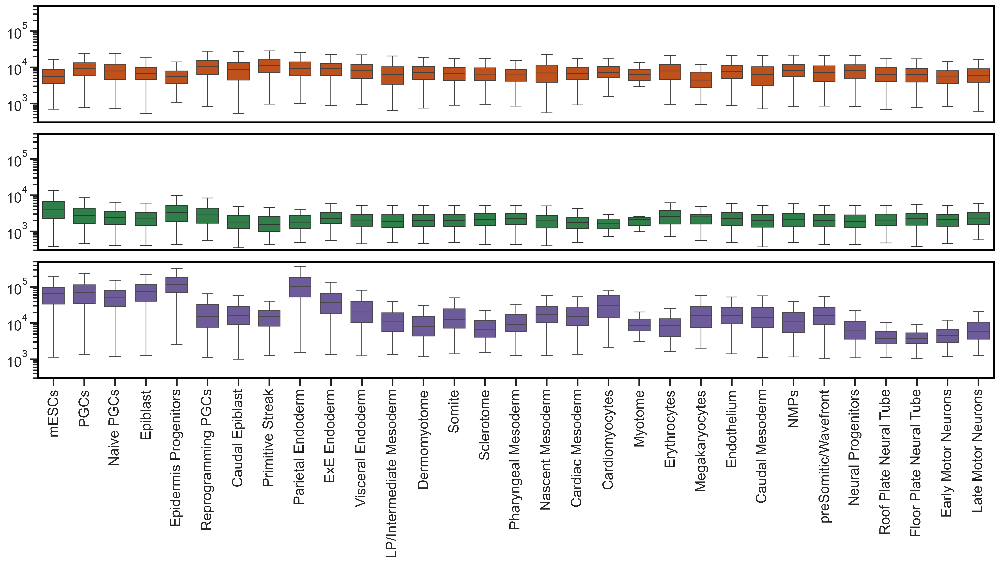

In [20]:
#figS3f
sns.set_context("talk", font_scale=1)
sns.set_style("whitegrid", {'axes.grid' : False, 'xtick.bottom': True,
 'ytick.left': True, 'axes.edgecolor': 'black'})

fig, axes = plt.subplots(3, 1, figsize=(20, 8), gridspec_kw={'hspace': 0.1})
axes = axes.flatten()

ax = sns.boxplot(data=plottable[plottable['mark']=='RNA'], x='cluster', y='count',orient='v',
    ax=axes[0], width=0.7, fliersize=0,color=Orange)


ax.tick_params(axis='x', rotation=90)
ax.tick_params(labelbottom=False, bottom=False)
axes[0].set_yscale('log')
ax.set_ylim([300,500000])

ax.set(xlabel='',
       ylabel='',
       title='')


ax = sns.boxplot(data=plottable[plottable['mark']=='H3K4me3'], x='cluster', y='count', orient='v', 
    ax=axes[1], width=0.7,fliersize=0 , color=Green)

ax.set_ylim([300,500000])
axes[1].set_yscale('log')
ax.tick_params(axis='x', rotation=90)
ax.tick_params(labelbottom=False, bottom=False)
ax.set(xlabel='',
       ylabel='',
       title='')


ax = sns.boxplot(data=plottable[plottable['mark']=='H3K27me3'], x='cluster', y='count',orient='v',
    ax=axes[2], width=0.7, fliersize=0,color=Purple)

ax.set_ylim([300,500000])
axes[2].set_yscale('log')
ax.tick_params(axis='x')


ax.set(xlabel='',
       ylabel='',
       title='')

plt.xticks(rotation=90)

plt.savefig('figures/FigS3f_boxplot_counts_per_celltype_split.pdf', dpi='figure', format='pdf', bbox_inches='tight')
plt.show()



In [39]:
#generate celltype heatmaps for Fig3d

def bintable_celltype(dataset, minsize=200):

    
    # prepare data
    RNA_table=pd.DataFrame(dataset.layers['matrix'].toarray())
    RNA_table.columns=dataset.var.index
    RNA_table.index=dataset.obs.index

    K4_table=pd.DataFrame(dataset[dataset.obs['mark']=='H3K4me3'].layers['k4me3_TSS_raw'].toarray())
    K4_table.columns=dataset[dataset.obs['mark']=='H3K4me3'].var.index
    K4_table.index=dataset[dataset.obs['mark']=='H3K4me3'].obs.index

    K27_table=pd.DataFrame(dataset[dataset.obs['mark']=='H3K27me3'].layers['k27me3_TSS_raw'].toarray())
    K27_table.columns=dataset[dataset.obs['mark']=='H3K27me3'].var.index
    K27_table.index=dataset[dataset.obs['mark']=='H3K27me3'].obs.index
    
    # Precompute valid cell types
    K4counts = dataset[dataset.obs['mark'] == 'H3K4me3'].obs['celltype'].value_counts()
    K27counts = dataset[dataset.obs['mark'] == 'H3K27me3'].obs['celltype'].value_counts()
    
    valid_celltypes = K4counts[K4counts > minsize].index.intersection(K27counts[K27counts > minsize].index)
    
    metadata = dataset.obs.sort_values(by='PT1', ascending=True)
    UMAPco = pd.DataFrame(dataset[metadata['cellname']].obsm['X_umap'], index=metadata.index)
    
    metadata = metadata.assign(UMAP1=UMAPco[0], UMAP2=UMAPco[1])

    # Initialize output containers
    output_list = []


    for i in valid_celltypes:
        # Sample cells for each mark
        K4cells = metadata.query(f"{'celltype'} == @i and mark == 'H3K4me3'").sample(n=minsize)
        K27cells = metadata.query(f"{'celltype'} == @i and mark == 'H3K27me3'").sample(n=minsize)
        RNAcells = pd.concat([K4cells, K27cells])


        # Compute mean expression values
        
        output_list.append(pd.DataFrame({
            'gene': RNA_table.columns,
            'celltype': i,
            'layer': 'RNA_lin',
            'counts': (RNA_table.loc[RNAcells.index, RNA_table.columns].mean(axis=0)).values
        }))

        output_list.append(pd.DataFrame({
            'gene': RNA_table.columns,
            'celltype': i,
            'layer': 'RNA_log',
            'counts': ((np.log2((RNA_table.loc[RNAcells.index, RNA_table.columns].sum(axis=0))+1))-(np.log2(len(RNAcells)))).values
        }))

        output_list.append(pd.DataFrame({
            'gene': K4_table.columns,
            'celltype': i,
            'layer': 'K4',
            'counts': (K4_table.loc[K4cells.index, K4_table.columns].mean(axis=0)).values
        }))

        output_list.append(pd.DataFrame({
            'gene': K27_table.columns,
            'celltype': i,
            'layer': 'K27',
            'counts': (K27_table.loc[K27cells.index, K27_table.columns].mean(axis=0)).values
        }))


    # Convert lists to DataFrames
    output = pd.concat(output_list, ignore_index=True)

    return output

In [50]:
def heatmap_lin(lineage):


    #select celltypes
    celltypes=adata[adata.obs['lineage'].isin(['Pluripotent',lineage])].obs
    celltypes=celltypes[~celltypes['celltype'].isin(['Epidermis Progenitors','Epiblast','Primitive Streak'])].sort_values('PT1_avg')
    celltypes['celltype']=celltypes['celltype'].cat.remove_unused_categories()
    celltypes=celltypes.groupby('celltype', observed=True).first().sort_values('PT1_avg')
    celltypes=celltypes[celltypes.index.isin(plottable_celltypes['celltype'].unique())]
    lineages=celltypes['lineage'].values
    celltypes=celltypes.index.values
    
    #identify genes with high enough expression for visualisation
    RNA_for_sel=plottable_celltypes[plottable_celltypes['layer']=='RNA_log'].pivot(index='celltype', columns='gene', values='counts')
    RNA_max=RNA_for_sel.loc[celltypes].max(axis=0)
    RNA_sel=RNA_max[RNA_max>0].index.values
    
    
    #subset adata
    adatasub=adata[adata.obs['celltype'].isin(celltypes)].copy()
    adatasub=adatasub[:,adatasub.var.index.isin(chrom_sel)].copy()
    adatasub=adatasub[:,adatasub.var.index.isin(RNA_sel)].copy()
    adatasub.layers['RNA_log']=adatasub.layers['matrix'].copy()
    adatasub.uns.pop('log1p', None)
    sc.pp.log1p(adatasub, layer='RNA_log')
    
    #identify diff genes
    sc.tl.rank_genes_groups(adatasub, 'celltype', method='wilcoxon', layer='RNA_log', use_raw=False)
    resultRNA = adatasub.uns['rank_genes_groups']
    
    resultsconcat=pd.DataFrame(columns=[0])
    for g in celltypes:
        resultsRNA=pd.DataFrame(resultRNA['scores'][g])
        resultsRNA['foldchange']=resultRNA['logfoldchanges'][g]
        resultsRNA.index=resultRNA['names'][g]
        resultsRNA=resultsRNA.sort_values(by=0, ascending=False)
        resultsRNA=resultsRNA[((resultsRNA['foldchange']>2))]
        resultsRNA=resultsRNA[resultsRNA.index.isin(plottable_celltypes['gene'].unique())]
        
        if resultsconcat.empty:
            resultsconcat = resultsRNA.iloc[:10].copy()
        else:
            resultsconcat = pd.concat([resultsconcat, resultsRNA.iloc[:10]])

    reghitlist=resultsconcat.index.unique()
    
    #prepare plotting tables
    
    RNAplotData=plottable_celltypes[plottable_celltypes['layer']=='RNA_lin'].pivot(index='celltype', columns='gene', values='counts')
    RNAplotData=RNAplotData.loc[celltypes,reghitlist]
    
    K4plotData=plottable_celltypes[plottable_celltypes['layer']=='K4'].pivot(index='celltype', columns='gene', values='counts')
    K4plotData=K4plotData.loc[celltypes,reghitlist]
    
    K27plotData=plottable_celltypes[plottable_celltypes['layer']=='K27'].pivot(index='celltype', columns='gene', values='counts')
    K27plotData=K27plotData.loc[celltypes,reghitlist]
    
    #plot
    
    sns.set_style("whitegrid", {'axes.grid' : False})
    fig=plt.figure(figsize=(20, 50))
    axes1 = fig.add_axes([0.1, 0.1, 0.38, 0.5]) # main axes
    axes1b = fig.add_axes([0.1, 0.08, 0.38, 0.015]) # main axes
    axes1c = fig.add_axes([0.1, 0.06, 0.38, 0.015]) # main axes
    
    axes2 = fig.add_axes([0.5, 0.1, 0.38, 0.5]) # inset axes
    axes2b = fig.add_axes([0.5, 0.08, 0.38, 0.015]) # main axes
    axes2c = fig.add_axes([0.5, 0.06, 0.38, 0.015]) # main axes
    
    axes3 = fig.add_axes([0.9, 0.1, 0.38, 0.5]) # inset axes
    axes3b = fig.add_axes([0.9, 0.08, 0.38, 0.015]) # main axes
    axes3c = fig.add_axes([0.9, 0.06, 0.38, 0.015]) # main axes
    
    #heatmap
    axes1.imshow(RNAplotData.T, interpolation='none', cmap=oranges_r, aspect='auto', vmax=25)
    axes1.set_axis_off()
    axes2.imshow(K4plotData.T, interpolation='none', cmap=greens_r, aspect='auto', vmax=0.4)
    axes2.set_axis_off()
    axes3.imshow(K27plotData.T, interpolation='none', cmap=purples_r, aspect='auto', vmax=2)
    axes3.set_axis_off()
    
    #annotations

    

    l_codes, l_uniques = pd.factorize(lineages)      
    # Make 2D for imshow
    l_img = l_codes[np.newaxis, :].astype(np.int32)

    # Build a discrete colormap
    l_colors = [lineagecdict[u] for u in l_uniques]
    l_cmap = ListedColormap(l_colors, name='cmap_lineage')

    c_codes, c_uniques = pd.factorize(celltypes)      
    # Make 2D for imshow
    c_img = c_codes[np.newaxis, :].astype(np.int32)

    # Build a discrete colormap
    c_colors = [celltypecdict[u] for u in c_uniques]
    c_cmap = ListedColormap(c_colors, name='cmap_celltypes')

    
    axes1b.imshow(c_img,interpolation='none', aspect='auto', cmap=c_cmap, vmin=0, vmax=len(c_colors)-1)
    axes1b.set_axis_off()
    axes1c.imshow(l_img,interpolation='none', aspect='auto', cmap=l_cmap, vmin=0, vmax=len(l_colors)-1)
    axes1c.set_axis_off()
    #axes1d.imshow(pd.DataFrame(cellnamesorterRNA['PT1']).T,interpolation='none', aspect='auto', cmap='Spectral_r')
    
    axes2b.imshow(c_img,interpolation='none', aspect='auto', cmap=c_cmap, vmin=0, vmax=len(c_colors)-1)
    axes2b.set_axis_off()
    axes2c.imshow(l_img,interpolation='none', aspect='auto', cmap=l_cmap, vmin=0, vmax=len(l_colors)-1)
    axes2c.set_axis_off()
    #axes2d.imshow(pd.DataFrame(cellnamesorterk4['PT1']).T,interpolation='none', aspect='auto', cmap='Spectral_r')
    
    axes3b.imshow(c_img,interpolation='none', aspect='auto', cmap=c_cmap, vmin=0, vmax=len(c_colors)-1)
    axes3b.set_axis_off()
    axes3c.imshow(l_img,interpolation='none', aspect='auto', cmap=l_cmap, vmin=0, vmax=len(l_colors)-1)
    axes3c.set_axis_off()

    filename='figures/Fif3d_heatmap_lin_'+lineage+'.svg'
    plt.savefig(filename, dpi=300, bbox_inches='tight')

    filename2='figures/fig3d_heatmap_lin_genelist'+lineage+'.txt'
    with open(filename2, 'w') as f:
        for item in reghitlist:
            f.write(f"{item}\n")

    plt.show()


In [41]:
#select protein coding genes
adata=adata[:,adata.var['gene_biotype']=='protein_coding']


#Prepare celltype pzseudobulks for plotting

plottable_celltypes=bintable_celltype(dataset=adata, minsize=200)


#determine mappable genes

K4_max=plottable_celltypes[plottable_celltypes['layer']=='K4'].pivot(index='celltype', columns='gene', values='counts').max(axis=0)
K27_max=plottable_celltypes[plottable_celltypes['layer']=='K27'].pivot(index='celltype', columns='gene', values='counts').max(axis=0)
chrom_max=K4_max+K27_max
chrom_sel=chrom_max[chrom_max>0.2].index.values

In [51]:
heatmap_lin(lineage='Ectoderm')

In [52]:
heatmap_lin(lineage='Mesoderm')

In [53]:
heatmap_lin(lineage='Endoderm')

In [54]:
plotdataED=adata[((adata.obs['lineage'].isin(['Pluripotent','Endoderm']))&(adata.obs['celltype_general']!='Epiblast'))].obs
tableEDRNA=pd.DataFrame(columns=['count','mark','PT','lin','celltype'])
tableEDRNA['count']=plotdataED['n_counts']
tableEDRNA['mark']='RNA'
tableEDRNA['PT']=plotdataED['PT1']
tableEDRNA['celltype']=plotdataED['celltype']
tableEDRNA['lin']=plotdataED['lin_day']
tableEDk4=pd.DataFrame(columns=['count','mark','PT','lin','celltype'])
tableEDk4['count']=plotdataED.loc[plotdataED['mark']=='H3K4me3','K4_total']
tableEDk4['mark']='H3K4me3'
tableEDk4['PT']=plotdataED.loc[plotdataED['mark']=='H3K4me3','PT1']
tableEDk4['celltype']=plotdataED.loc[plotdataED['mark']=='H3K4me3','celltype']
tableEDk4['lin']=plotdataED['lin_day']
tableEDk27=pd.DataFrame(columns=['count','mark','PT','lin','celltype'])
tableEDk27['count']=plotdataED.loc[plotdataED['mark']=='H3K27me3','K27_total']
tableEDk27['mark']='H3K27me3'
tableEDk27['PT']=plotdataED.loc[plotdataED['mark']=='H3K27me3','PT1']
tableEDk27['celltype']=plotdataED.loc[plotdataED['mark']=='H3K27me3','celltype']
tableEDk27['lin']=plotdataED['lin_day']
tableED=pd.concat([tableEDRNA, tableEDk4, tableEDk27])

plotdataEC=adata[((adata.obs['lineage'].isin(['Pluripotent','Ectoderm']))&(adata.obs['celltype_general']!='Epiblast'))].obs
tableECRNA=pd.DataFrame(columns=['count','mark','PT','lin','celltype'])
tableECRNA['count']=plotdataEC['n_counts']
tableECRNA['mark']='RNA'
tableECRNA['PT']=plotdataEC['PT1']
tableECRNA['celltype']=plotdataEC['celltype']
tableECRNA['lin']=plotdataEC['lin_day']
tableECk4=pd.DataFrame(columns=['count','mark','PT','lin','celltype'])
tableECk4['count']=plotdataEC.loc[plotdataEC['mark']=='H3K4me3','K4_total']
tableECk4['mark']='H3K4me3'
tableECk4['PT']=plotdataEC.loc[plotdataEC['mark']=='H3K4me3','PT1']
tableECk4['celltype']=plotdataEC.loc[plotdataEC['mark']=='H3K4me3','celltype']
tableECk4['lin']=plotdataEC['lin_day']
tableECk27=pd.DataFrame(columns=['count','mark','PT','lin','celltype'])
tableECk27['count']=plotdataEC.loc[plotdataEC['mark']=='H3K27me3','K27_total']
tableECk27['mark']='H3K27me3'
tableECk27['PT']=plotdataEC.loc[plotdataEC['mark']=='H3K27me3','PT1']
tableECk27['celltype']=plotdataEC.loc[plotdataEC['mark']=='H3K27me3','celltype']
tableECk27['lin']=plotdataEC['lin_day']
tableEC=pd.concat([tableECRNA, tableECk4, tableECk27])
tableEC['log_count']=np.log10(tableEC['count']+1)

plotdataME=adata[((adata.obs['lineage'].isin(['Pluripotent','Mesoderm']))&(adata.obs['celltype_general']!='Epiblast'))].obs
tableMERNA=pd.DataFrame(columns=['count','mark','PT','lin','celltype'])
tableMERNA['count']=plotdataME['n_counts']
tableMERNA['mark']='RNA'
tableMERNA['PT']=plotdataME['PT1']
tableMERNA['celltype']=plotdataME['celltype']
tableMERNA['lin']=plotdataME['lin_day']
tableMEk4=pd.DataFrame(columns=['count','mark','PT','lin','celltype'])
tableMEk4['count']=plotdataME.loc[plotdataME['mark']=='H3K4me3','K4_total']
tableMEk4['mark']='H3K4me3'
tableMEk4['PT']=plotdataME.loc[plotdataME['mark']=='H3K4me3','PT1']
tableMEk4['celltype']=plotdataME.loc[plotdataME['mark']=='H3K4me3','celltype']
tableMEk4['lin']=plotdataME['lin_day']
tableMEk27=pd.DataFrame(columns=['count','mark','PT','lin','celltype'])
tableMEk27['count']=plotdataME.loc[plotdataME['mark']=='H3K27me3','K27_total']
tableMEk27['mark']='H3K27me3'
tableMEk27['PT']=plotdataME.loc[plotdataME['mark']=='H3K27me3','PT1']
tableMEk27['celltype']=plotdataME.loc[plotdataME['mark']=='H3K27me3','celltype']
tableMEk27['lin']=plotdataME['lin_day']
tableME=pd.concat([tableMERNA, tableMEk4, tableMEk27])


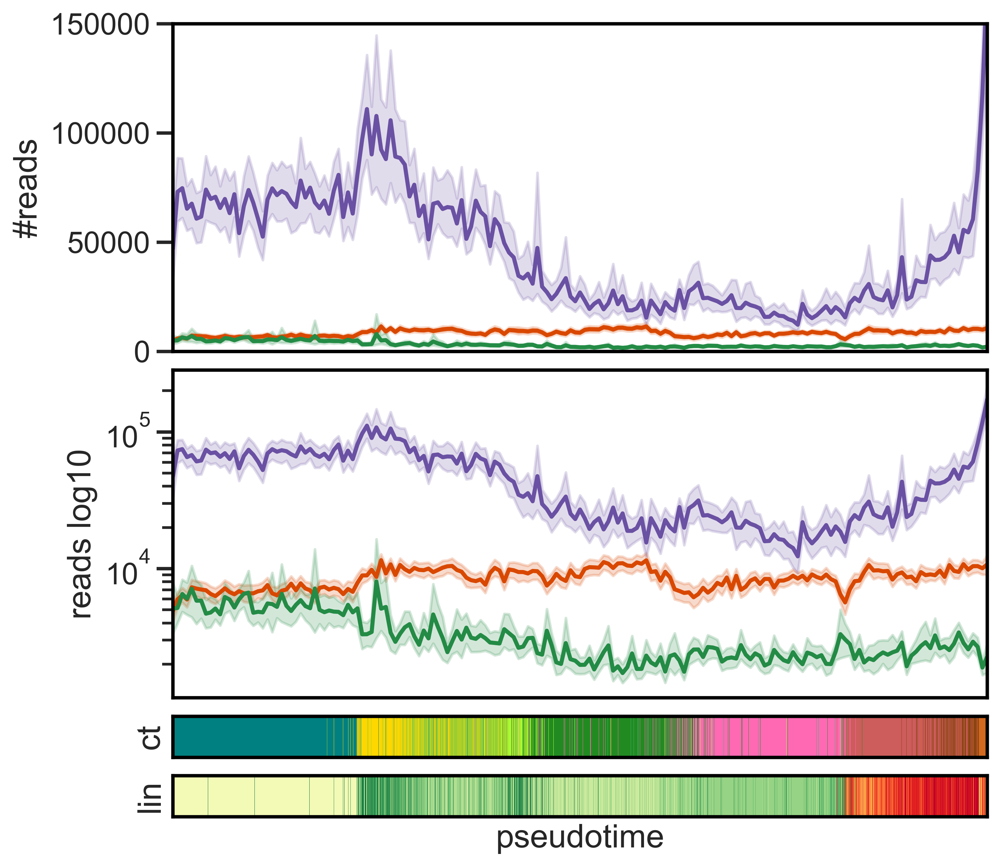

In [55]:
tableED=tableED.sort_values(by='PT', ascending=True)
tableED['PT']=list(range(0,len(tableED)))
tableED2=tableED.copy()
tableED2['PT']=tableED2['PT']/200
tableED2=tableED2.round({'PT': 0})
tableED2['PT']=tableED2['PT']*200


sns.set_context("talk", font_scale=1)
sns.set_style("whitegrid", {'axes.grid' : False, 'xtick.bottom': True,
 'ytick.left': True, 'axes.edgecolor': 'black'})

fig, axes = plt.subplots(4, 1, figsize=(8, 8), gridspec_kw={'hspace': 0.1, 'height_ratios':[4,4, 0.5, 0.5]})
axes = axes.flatten()

ax=sns.lineplot(x="PT", y="count", ax=axes[0],
             hue="mark", palette=(Orange,Green,Purple), hue_order=('RNA','H3K4me3','H3K27me3'),
             data=tableED2, legend=False)
ax.tick_params(labelbottom=False, bottom=False)
ax.set_xlim([tableED2['PT'].min(),tableED2['PT'].max()])
ax.set_ylim([0,150000])
ax.set(xlabel='',
       ylabel='#reads',
       title='')

ax=sns.lineplot(x="PT", y="count", ax=axes[1],
             hue="mark", palette=(Orange,Green,Purple), hue_order=('RNA','H3K4me3','H3K27me3'),
             data=tableED2, legend=False)
ax.tick_params(labelbottom=False, bottom=False)
axes[1].set_yscale('log')
ax.set_xlim([tableED2['PT'].min(),tableED2['PT'].max()])
ax.set(xlabel='',
       ylabel='reads log10',
       title='')

axes[2].imshow(pd.DataFrame(pd.factorize(tableED2['celltype'])[0]).T,interpolation='none', aspect='auto', cmap=LinearSegmentedColormap.from_list('cmap_celltypes', list( map(celltypecdict.get, list(tableED2['celltype'].unique()))), N=len(list( map(celltypecdict.get, list(tableED2['celltype'].unique()))))))
axes[2].tick_params(labelbottom=False, bottom=False)
axes[2].tick_params(labelleft=False, left=False)
axes[2].set(xlabel='',
       ylabel='ct',
       title='')


axes[3].imshow(pd.DataFrame(pd.factorize(tableED2['lin'])[0]).T,interpolation='none', aspect='auto', cmap=LinearSegmentedColormap.from_list('cmap_lin', list( map(lindaydict.get, list(tableED2['lin'].unique()))), N=len(list( map(lindaydict.get, list(tableED2['lin'].unique()))))))
axes[3].tick_params(labelleft=False, left=False)
axes[3].tick_params(labelbottom=False, bottom=False)
axes[3].set(xlabel='pseudotime',
       ylabel='lin',
       title='')



plt.savefig('figures/Fig4a_H3K27loss_lineplot_scaled_ED_log_lin_ct_linday.pdf', dpi='figure', format='pdf', bbox_inches='tight')
plt.show()





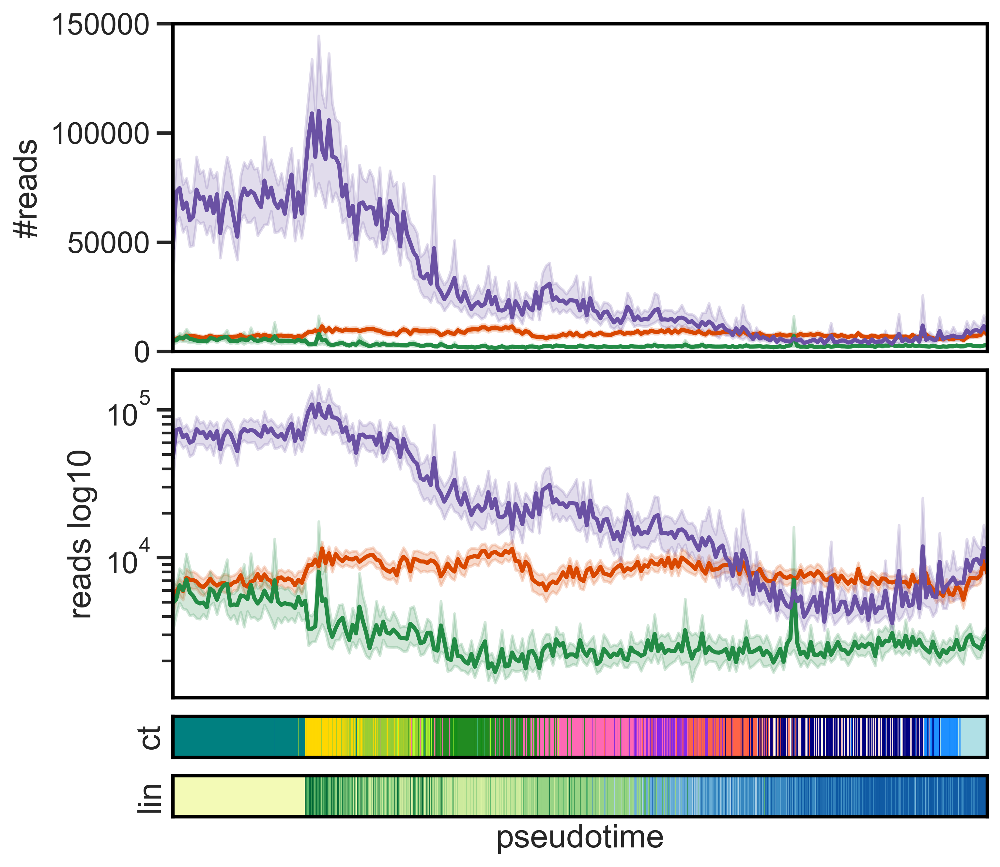

In [56]:
tableEC=tableEC.sort_values(by='PT', ascending=True)
tableEC['PT']=list(range(0,len(tableEC)))
tableEC2=tableEC.copy()
tableEC2['PT']=tableEC2['PT']/200
tableEC2=tableEC2.round({'PT': 0})
tableEC2['PT']=tableEC2['PT']*200


sns.set_context("talk", font_scale=1)
sns.set_style("whitegrid", {'axes.grid' : False, 'xtick.bottom': True,
 'ytick.left': True, 'axes.edgecolor': 'black'})

fig, axes = plt.subplots(4, 1, figsize=(8, 8), gridspec_kw={'hspace': 0.1, 'height_ratios':[4,4, 0.5, 0.5]})
axes = axes.flatten()

ax=sns.lineplot(x="PT", y="count", ax=axes[0],
             hue="mark", palette=(Orange,Green,Purple), hue_order=('RNA','H3K4me3','H3K27me3'),
             data=tableEC2, legend=False)
ax.tick_params(labelbottom=False, bottom=False)
ax.set_xlim([tableEC2['PT'].min(),tableEC2['PT'].max()])
ax.set_ylim([0,150000])
ax.set(xlabel='',
       ylabel='#reads',
       title='')

ax=sns.lineplot(x="PT", y="count", ax=axes[1],
             hue="mark", palette=(Orange,Green,Purple), hue_order=('RNA','H3K4me3','H3K27me3'),
             data=tableEC2, legend=False)
ax.tick_params(labelbottom=False, bottom=False)
axes[1].set_yscale('log')
ax.set_xlim([tableEC2['PT'].min(),tableEC2['PT'].max()])
ax.set(xlabel='',
       ylabel='reads log10',
       title='')

axes[2].imshow(pd.DataFrame(pd.factorize(tableEC2['celltype'])[0]).T,interpolation='none', aspect='auto', cmap=LinearSegmentedColormap.from_list('cmap_celltypes', list( map(celltypecdict.get, list(tableEC2['celltype'].unique()))), N=len(list( map(celltypecdict.get, list(tableEC2['celltype'].unique()))))))
axes[2].tick_params(labelbottom=False, bottom=False)
axes[2].tick_params(labelleft=False, left=False)
axes[2].set(xlabel='',
       ylabel='ct',
       title='')


axes[3].imshow(pd.DataFrame(pd.factorize(tableEC2['lin'])[0]).T,interpolation='none', aspect='auto', cmap=LinearSegmentedColormap.from_list('cmap_lin', list( map(lindaydict.get, list(tableEC2['lin'].unique()))), N=len(list( map(lindaydict.get, list(tableEC2['lin'].unique()))))))
axes[3].tick_params(labelleft=False, left=False)
axes[3].tick_params(labelbottom=False, bottom=False)
axes[3].set(xlabel='pseudotime',
       ylabel='lin',
       title='')



plt.savefig('figures/fig4a_H3K27loss_lineplot_scaled_EC_log_lin_ct_linday.pdf', dpi='figure', format='pdf', bbox_inches='tight')
plt.show()





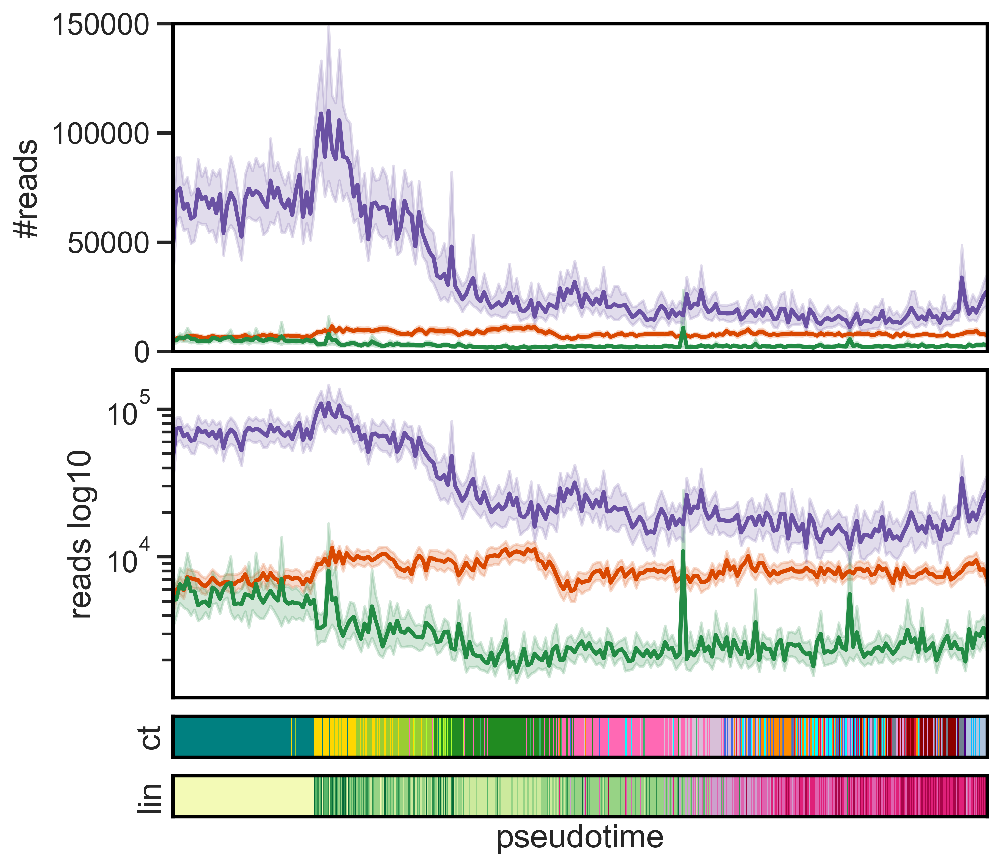

In [57]:
tableME=tableME.sort_values(by='PT', ascending=True)
tableME['PT']=list(range(0,len(tableME)))
tableME2=tableME.copy()
tableME2['PT']=tableME2['PT']/200
tableME2=tableME2.round({'PT': 0})
tableME2['PT']=tableME2['PT']*200


sns.set_context("talk", font_scale=1)
sns.set_style("whitegrid", {'axes.grid' : False, 'xtick.bottom': True,
 'ytick.left': True, 'axes.edgecolor': 'black'})

fig, axes = plt.subplots(4, 1, figsize=(8, 8), gridspec_kw={'hspace': 0.1, 'height_ratios':[4,4, 0.5, 0.5]})
axes = axes.flatten()

ax=sns.lineplot(x="PT", y="count", ax=axes[0],
             hue="mark", palette=(Orange,Green,Purple), hue_order=('RNA','H3K4me3','H3K27me3'),
             data=tableME2, legend=False)
ax.tick_params(labelbottom=False, bottom=False)
ax.set_xlim([tableME2['PT'].min(),tableME2['PT'].max()])
ax.set_ylim([0,150000])
ax.set(xlabel='',
       ylabel='#reads',
       title='')

ax=sns.lineplot(x="PT", y="count", ax=axes[1],
             hue="mark", palette=(Orange,Green,Purple), hue_order=('RNA','H3K4me3','H3K27me3'),
             data=tableME2, legend=False)
ax.tick_params(labelbottom=False, bottom=False)
axes[1].set_yscale('log')
ax.set_xlim([tableME2['PT'].min(),tableME2['PT'].max()])
ax.set(xlabel='',
       ylabel='reads log10',
       title='')

axes[2].imshow(pd.DataFrame(pd.factorize(tableME2['celltype'])[0]).T,interpolation='none', aspect='auto', cmap=LinearSegmentedColormap.from_list('cmap_celltypes', list( map(celltypecdict.get, list(tableME2['celltype'].unique()))), N=len(list( map(celltypecdict.get, list(tableME2['celltype'].unique()))))))
axes[2].tick_params(labelbottom=False, bottom=False)
axes[2].tick_params(labelleft=False, left=False)
axes[2].set(xlabel='',
       ylabel='ct',
       title='')


axes[3].imshow(pd.DataFrame(pd.factorize(tableME2['lin'])[0]).T,interpolation='none', aspect='auto', cmap=LinearSegmentedColormap.from_list('cmap_lin', list( map(lindaydict.get, list(tableME2['lin'].unique()))), N=len(list( map(lindaydict.get, list(tableME2['lin'].unique()))))))
axes[3].tick_params(labelleft=False, left=False)
axes[3].tick_params(labelbottom=False, bottom=False)
axes[3].set(xlabel='pseudotime',
       ylabel='lin',
       title='')



plt.savefig('figures/fig4a_H3K27loss_lineplot_scaled_ME_log_lin_ct_linday.pdf', dpi='figure', format='pdf', bbox_inches='tight')
plt.show()



